<a href="https://colab.research.google.com/github/dukei/dls-fr/blob/master/DLS-project-FR-3_RecognitionPipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Пайплайн для распознавания

Для детекции будем использовать retinaface для pytorch из этого репозитория https://github.com/ternaus/retinaface. По результатам тестирования он победил YuNet и mtcnn.

Для всего остального будем использовать наш код из других ноутбуков. Подгрузим для этого предварительно сохраненные из прошлых ноутбуков файлы с кодом

In [13]:
!pip install -U retinaface_pytorch > /dev/null

In [2]:
import cv2

In [3]:
from matplotlib import pyplot as plt
from retinaface.pre_trained_models import get_model
from retinaface.utils import vis_annotations
import torch

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [5]:
# Распознавание лэндмарков
%run celeba_dataset/faces_shgn.py

# Распознавание лиц
%run celeba_dataset/faces_recognition.py

# Классы для преобразований из датасета
%run celeba_dataset/faces_dataset.py

## Класс пайплайна

Принцип простой - в конструкторе загружаются все нейросети и инициализируются преобразования, в forward - это всё последовательно применяется

In [6]:
import torch
import torch.nn as nn
import torchvision.transforms.v2 as v2
import torchvision.transforms.functional as F_vision
from torchvision.tv_tensors import KeyPoints
from PIL import Image
import numpy as np
import cv2
import os

class FaceRecognitionPipeline(nn.Module):
    def __init__(self):
        super().__init__()
        # Инициализация устройства (GPU, если доступно, иначе CPU)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Загрузка модели RetinaFace
        self.retinaface = get_model("resnet50_2020-07-20", max_size=2048, device=self.device)
        self.retinaface.eval() # Установка режима оценки

        # Инициализация и загрузка весов для FacialHourglassNet
        self.hourglass_net = FacialHourglassNet(num_stacks=3, num_keypoints=5)
        # Загружаем модель
        hourglass_model_path = 'celeba_dataset/sm/face_hg_model.pt'
        if os.path.exists(hourglass_model_path):
            self.hourglass_net.load_state_dict(torch.load(hourglass_model_path, map_location=self.device))
            print(f"Загружена модель HourglassNet из {hourglass_model_path}")
        else:
            print(f"Предупреждение: Модель HourglassNet не найдена по пути {hourglass_model_path}. Пожалуйста, обучите ее сначала.")

        self.hourglass_net = self.hourglass_net.to(self.device)
        self.hourglass_net.eval() # Установка режима оценки

        # Инициализация и загрузка весов для FaceRecognitionModel
        # NORMALIZE_MEAN и NORMALIZE_STD определены в faces_dataset.py, убедитесь, что они доступны
        global NORMALIZE_MEAN, NORMALIZE_STD, DEVICE # Для обеспечения области видимости

        self.face_recognition_model = FaceRecognitionModel(
            num_classes=2131, # Предполагается 2131 уникальных идентификатора (класса) из предыдущего обучения
            backbone_name='efficientnet_b1',
            loss_type='adacos'
        )
        face_rec_model_path = 'celeba_dataset/checkpoints/best_model_efficientnet_20_adacos.pth'
        if os.path.exists(face_rec_model_path):
            self.face_recognition_model.load_state_dict(torch.load(face_rec_model_path, map_location=self.device))
            print(f"Загружена модель FaceRecognitionModel из {face_rec_model_path}")
        else:
            print(f"Предупреждение: Модель FaceRecognitionModel не найдена по пути {face_rec_model_path}. Пожалуйста, обучите ее сначала.")

        self.face_recognition_model = self.face_recognition_model.to(self.device)
        self.face_recognition_model.eval() # Установка режима оценки

        # Предобработка для HourglassNet
        # Ожидает словарь {'image': PIL_Image, 'keypoints': KeyPoints} и выдает такой же словарь
        self.preprocess_for_hourglass = v2.Compose([
            v2.PILToTensor(),
            v2.ToDtype(torch.float32, scale=True),
            ResizeAndPadToSquare(128),
            v2.Normalize(mean=NORMALIZE_MEAN, std=NORMALIZE_STD)
        ])

        # Предобработка для полноразмерных обрезанных изображений перед выравниванием
        # Ожидает словарь {'image': PIL_Image, 'keypoints': KeyPoints} и выдает такой же словарь
        self.align_face_transform = v2.Compose([
            v2.PILToTensor(),
            v2.ToDtype(torch.float32, scale=True),
            ResizeAndPadToSquare(240),
            AlignFace(),
            v2.Normalize(mean=NORMALIZE_MEAN, std=NORMALIZE_STD)
        ])

        # Изменение размера для FaceRecognitionModel
        self.resize_for_recognition = v2.Resize((240, 240), antialias=True)

    @torch.no_grad()
    def forward(self, image_input):
        # Если вход не список, преобразуем его в список
        if not isinstance(image_input, list):
            image_input = [image_input]

        pipeline_results = []

        for img_index, img_data in enumerate(image_input):
            original_image_rgb_np = None
            if isinstance(img_data, str): # Путь к изображению
                if not os.path.exists(img_data):
                    print(f"Предупреждение: Изображение не найдено по пути {img_data}. Пропускаем.")
                    continue
                original_image_bgr_np = cv2.imread(img_data)
                if original_image_bgr_np is None:
                    print(f"Предупреждение: Не удалось прочитать изображение по пути {img_data}. Пропускаем.")
                    continue
                original_image_rgb_np = cv2.cvtColor(original_image_bgr_np, cv2.COLOR_BGR2RGB)
            elif isinstance(img_data, np.ndarray):
                if img_data.ndim == 3 and img_data.shape[2] == 3: # Предполагается RGB или BGR
                    # Если это BGR, конвертируем в RGB. Это эвристика.
                    if img_data[0,0,0] > img_data[0,0,2] and img_data[0,0,1] < img_data[0,0,0]: # Вероятно BGR
                        original_image_rgb_np = cv2.cvtColor(img_data, cv2.COLOR_BGR2RGB)
                    else:
                        original_image_rgb_np = img_data # Предполагается, что уже RGB
                else:
                    print(f"Предупреждение: Неверная форма массива numpy для изображения. Ожидается 3D с 3 каналами. Получено {img_data.shape}. Пропускаем.")
                    continue
            elif isinstance(img_data, Image.Image):
                original_image_rgb_np = np.array(img_data.convert('RGB'))
            else:
                print(f"Предупреждение: Неподдерживаемый тип входного изображения: {type(img_data)}. Пропускаем.")
                continue # Исправлен отступ здесь

            # Обнаружение лиц с помощью RetinaFace
            retinaface_annotations = self.retinaface.predict_jsons(original_image_rgb_np)

            if not retinaface_annotations:
                print("Лица не обнаружены, пропускаем это изображение.")
                continue

            for annotation in retinaface_annotations:
                bbox = annotation['bbox'] # [x1, y1, x2, y2]

                x1, y1, x2, y2 = [int(val) for val in bbox]

                # Обеспечиваем корректные координаты ограничивающей рамки для обрезки
                addx = (x2-x1)*0.2
                addy = (y2-y1)*0.2
                x1 = int(max(0, x1 - addx))
                y1 = int(max(0, y1 - addy))
                x2 = int(min(original_image_rgb_np.shape[1], x2 + addx))
                y2 = int(min(original_image_rgb_np.shape[0], y2 + addy))

                bbox = [x1, y1, x2, y2]

                if x2 <= x1 or y2 <= y1:
                    print(f"Предупреждение: Неверная ограничивающая рамка для лица. Пропускаем. Bbox: {bbox}")
                    continue

                cropped_face_np = original_image_rgb_np[y1:y2, x1:x2]
                # Масштабирование лэндмарков Hourglass из пространства 128x128 обратно к исходным размерам обрезанного лица
                original_crop_w = float(x2 - x1)
                original_crop_h = float(y2 - y1)

                # Преобразование массива numpy в PIL Image для трансформаций torchvision
                cropped_face_pil = Image.fromarray(cropped_face_np)
                #print('Cropped: ', cropped_face_pil.width, cropped_face_pil.height)

                keypoints_for_kp = KeyPoints(
                    torch.tensor(
                        [[0,0],[0,0],[0,0],[0,0],[0,0],
                        [0,0],[1000,1000]
                    ], device=self.device),
                    canvas_size=(int(original_crop_h), int(original_crop_w)), # Использование исходных размеров обрезанного лица
                    device=self.device
                )

                # Предобработка для HourglassNet (изменение размера до 128x128)
                hg_input_data = {'image': cropped_face_pil, 'keypoints': keypoints_for_kp}
                processed_hg_data = self.preprocess_for_hourglass(hg_input_data)
                cropped_face_tensor_for_hg = processed_hg_data['image'].unsqueeze(0).to(self.device)

                #print('Cropped pre landmarks: ', cropped_face_tensor_for_hg.shape)

                # Предсказание лэндмарков с помощью HourglassNet
                pred_heatmaps_list = self.hourglass_net(cropped_face_tensor_for_hg)
                # Получаем 5 координат ключевых точек из последней тепловой карты, убираем размер батча
                predicted_hourglass_kps = self.hourglass_net.get_expected_coords(pred_heatmaps_list[-1]).squeeze(0)
                predicted_kps_on_original_crop = FacesDataset.restoreKeyPoints(processed_hg_data['keypoints'], predicted_hourglass_kps)

                keypoints_for_preprocess = KeyPoints(predicted_kps_on_original_crop,
                    canvas_size=(int(original_crop_h), int(original_crop_w)), # Использование исходных размеров обрезанного лица
                    device=self.device
                )

                # Подготовка изображения для выравнивания путем его обработки
                alignment_img_data = {'image': cropped_face_pil, "keypoints": keypoints_for_preprocess}
                aligned_output_data = self.align_face_transform(alignment_img_data)

                # Извлечение aligned_face_tensor из aligned_output_data['image']
                aligned_face_tensor = aligned_output_data['image'].to(self.device)
                # Извлечение aligned_hourglass_kps из aligned_output_data['keypoints'].data
                aligned_hourglass_kps = aligned_output_data['keypoints'].data

                # Изменение размера выровненного лица для модели распознавания лиц
                #recognition_input_tensor = self.resize_for_recognition(aligned_face_tensor).unsqueeze(0).to(self.device)

                # Генерация эмбеддингов
                embedding = self.face_recognition_model(aligned_face_tensor.unsqueeze(0), return_features_only=True).squeeze(0)

                # Сохраняем результаты для текущего лица
                face_result = {
                    'original_image_index': img_index, # Добавляем индекс исходного изображения
                    'bbox': bbox, # Координаты ограничивающей рамки на оригинальном изображении
                    'landmarks': predicted_kps_on_original_crop.cpu(), # Лэндмарки Hourglass в пространстве обрезанного 128x128 изображения
                    'aligned_landmarks': aligned_hourglass_kps.cpu(), # Выровненные лэндмарки в пространстве выровненного (original crop size) изображения
                    'aligned_face_image_tensor': aligned_face_tensor.cpu(), # Нормализованный, выровненный тензор изображения (original crop size)
                    'embedding': embedding.cpu()
                }
                pipeline_results.append(face_result)

        return pipeline_results

Загрузим изображения, на которых будем тестировать

In [7]:
import os
if not os.path.exists("celeba_dataset/family1.jpg") or not os.path.exists("celeba_dataset/family2.jpg"):
    !wget -O celeba_dataset/family1.jpg https://img.freepik.com/premium-photo/happy-family-portrait-mother-daughter-father-grandmother-home_221436-3676.jpg > /dev/null
    !wget -O celeba_dataset/family2.jpg https://img.freepik.com/premium-photo/happy-family-grandmother-mother-daughter-father_221436-3663.jpg > /dev/null

Поехали!

In [8]:
face_pipeline = FaceRecognitionPipeline()
image_paths = ['celeba_dataset/family1.jpg', 'celeba_dataset/family2.jpg']
pipeline_results = face_pipeline(image_paths)
print(f"Processed {len(pipeline_results)} faces across the images.")

/home/dukei/anaconda3/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dukei/anaconda3/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/home/dukei/anaconda3/lib/python3.13/site-packages/torch/hub.py:879: FutureWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  return _legacy_zip_load(cached_file, model_dir, map_location, weights_only)


Загружена модель HourglassNet из celeba_dataset/sm/face_hg_model.pt
Загружена модель FaceRecognitionModel из celeba_dataset/checkpoints/best_model_efficientnet_20_adacos.pth
Processed 8 faces across the images.


Теперь посмотрим, кого и на чем мы нашли

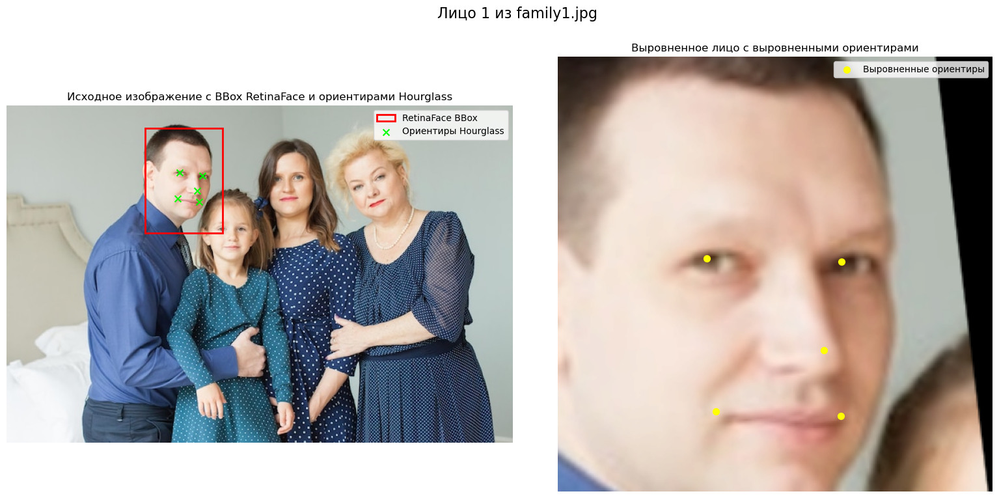

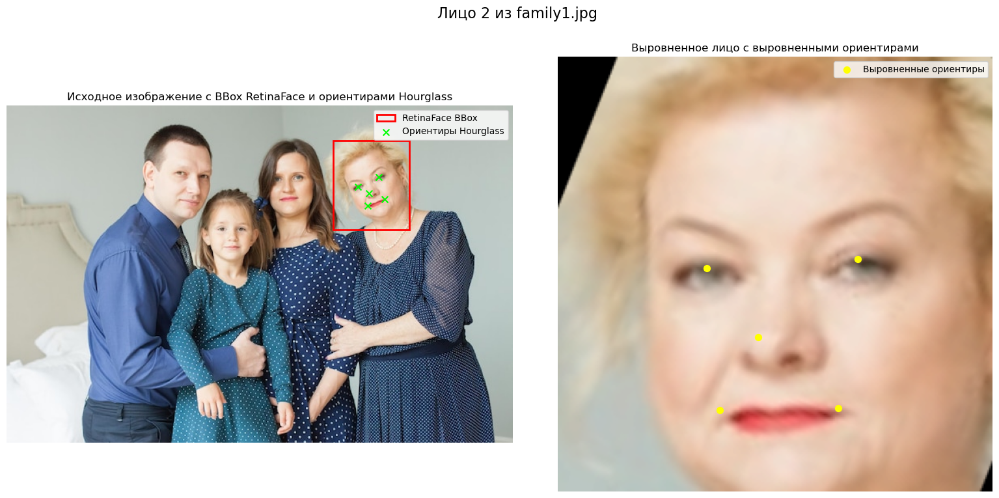

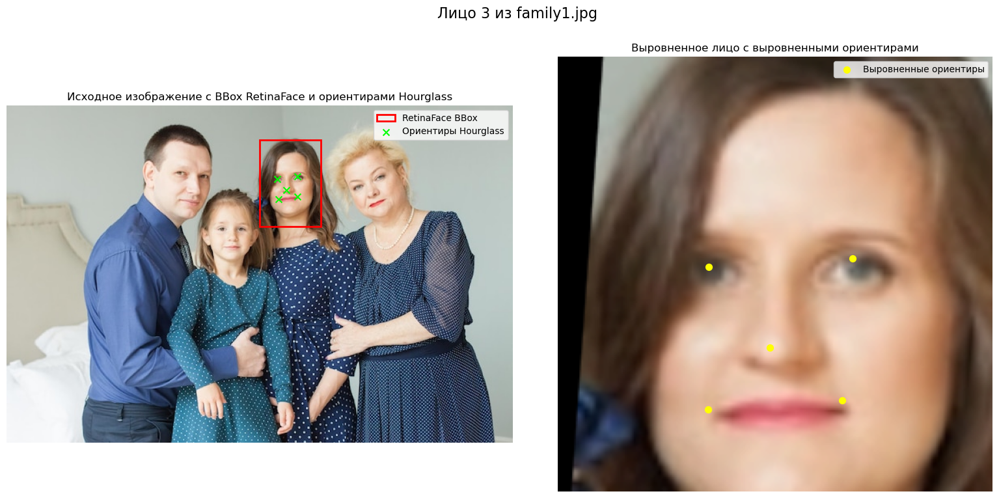

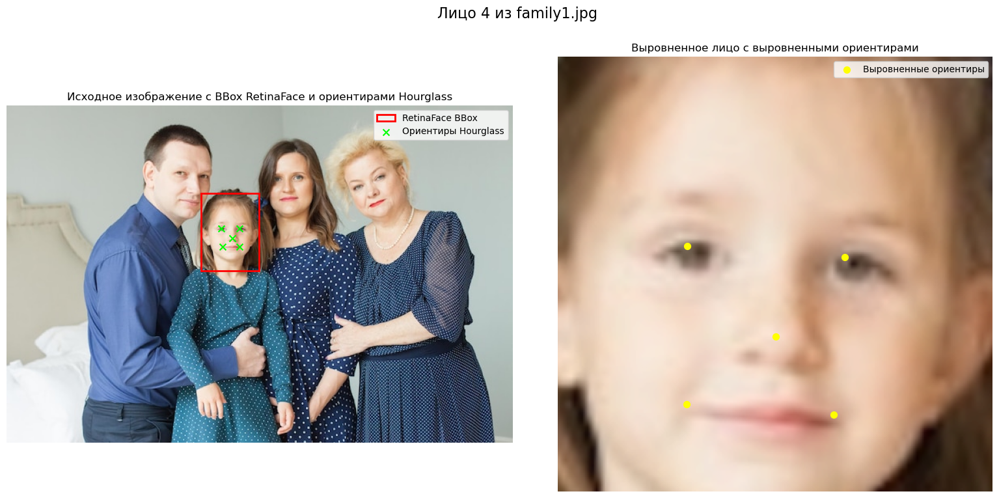

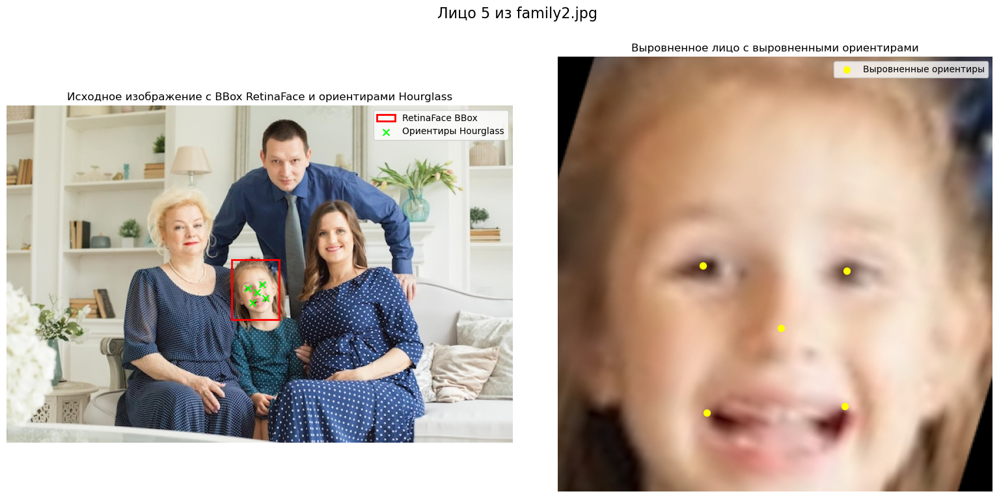

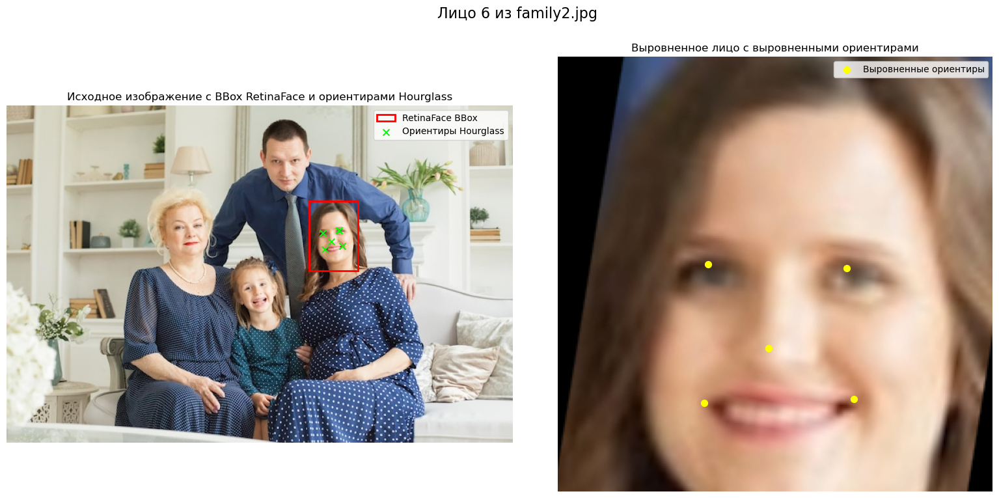

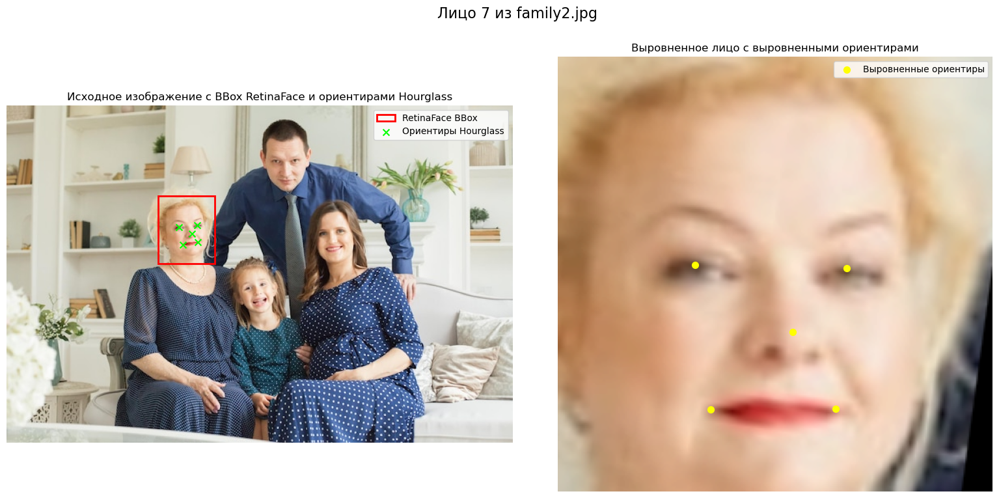

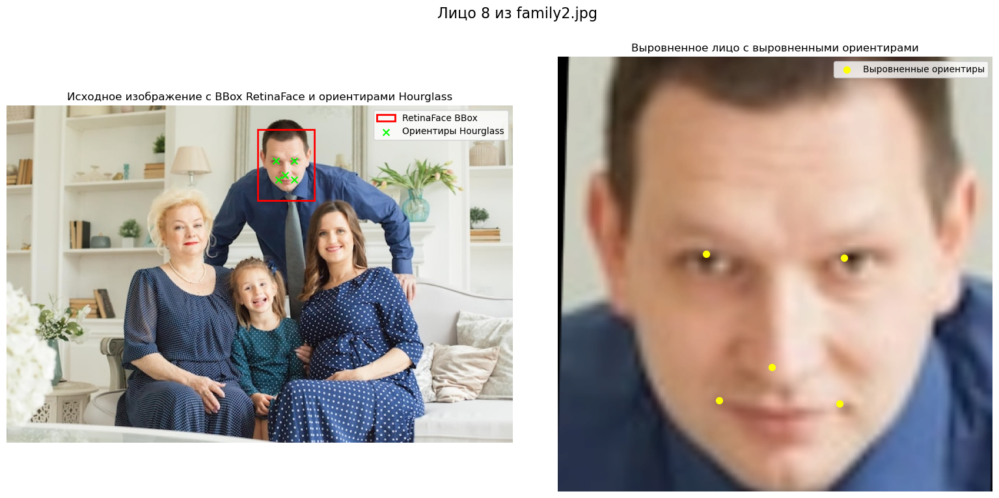

Отображено 8 фигур визуализации.


In [9]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

def denormalize_image(tensor):
    mean = torch.tensor(NORMALIZE_MEAN, device=tensor.device).view(3, 1, 1)
    std = torch.tensor(NORMALIZE_STD, device=tensor.device).view(3, 1, 1)
    denormalized = tensor * std + mean
    return denormalized.permute(1, 2, 0).cpu().numpy()

# Группируем исходные изображения для эффективной загрузки и отображения
# Загружаем их только один раз.
original_images_cache = {}
for img_path in image_paths:
    original_images_cache[img_path] = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

fig_count = 0
# Теперь напрямую итерируемся по pipeline_results, так как в них уже есть вся необходимая информация
for i, face_data in enumerate(pipeline_results):
    # Извлекаем данные для текущего лица
    original_image_index = face_data['original_image_index']
    original_image_path = image_paths[original_image_index]
    original_image_rgb_np = original_images_cache[original_image_path].copy()

    bbox = face_data['bbox'] # RetinaFace BBox
    landmarks = face_data['landmarks'] # Hourglass landmarks в пространстве обрезанного 128x128 изображения
    aligned_landmarks = face_data['aligned_landmarks'] # Выровненные ориентиры в пространстве выровненного изображения
    aligned_face_tensor = face_data['aligned_face_image_tensor']
    # embedding = face_data['embedding'] # Эмбеддинг для распознавания лица

    # Денормализовать выровненное изображение лица для отображения
    display_aligned_face = np.clip(denormalize_image(aligned_face_tensor), 0, 1)

    # Создать фигуру с двумя подграфиками
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    fig.suptitle(f"Лицо {i+1} из {os.path.basename(original_image_path)}", fontsize=16)

    # Подграфик 1: Исходное изображение с ограничивающей рамкой RetinaFace и ориентирами Hourglass
    ax1 = axes[0]
    ax1.imshow(original_image_rgb_np)
    ax1.set_title('Исходное изображение с BBox RetinaFace и ориентирами Hourglass')

    # Нарисовать ограничивающую рамку RetinaFace на исходном изображении
    x1, y1, x2, y2 = [int(v) for v in bbox]
    rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none', label='RetinaFace BBox')
    ax1.add_patch(rect)

    # Нарисовать ориентиры Hourglass (масштабированные до исходного обрезанного изображения) на исходном изображении
    scaled_hourglass_landmarks = landmarks.cpu().numpy() + np.array([x1, y1])
    ax1.scatter(scaled_hourglass_landmarks[:, 0], scaled_hourglass_landmarks[:, 1], color='lime', s=50, marker='x', label='Ориентиры Hourglass')
    ax1.legend()
    ax1.axis('off')

    # Подграфик 2: Выровненное изображение лица с выровненными ориентирами
    ax2 = axes[1]
    ax2.imshow(display_aligned_face)
    ax2.set_title('Выровненное лицо с выровненными ориентирами')
    # Нарисовать выровненные ориентиры на выровненном изображении лица (пространство 240x240)
    ax2.scatter(aligned_landmarks[:, 0].cpu().numpy(), aligned_landmarks[:, 1].cpu().numpy(), color='yellow', s=50, marker='o', label='Выровненные ориентиры')
    ax2.legend()
    ax2.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Настроить макет, чтобы предотвратить перекрытие заголовков
    plt.show()
    fig_count += 1

print(f"Отображено {fig_count} фигур визуализации.")

# Работа с эмбеддингами

Для начала соберем эмбеддинги

In [10]:
extracted_embeddings = []

for i, face_data in enumerate(pipeline_results):
    # original_image_index is already available in face_data
    image_path = image_paths[face_data['original_image_index']]
    bbox = face_data['bbox']
    embedding = face_data['embedding']

    extracted_embeddings.append({
        'image_path': image_path,
        'face_index': i,
        'bbox': bbox,
        'embedding': embedding
    })

print(f"Извлечено {len(extracted_embeddings)} эмбеддингов с метаданными.")

Извлечено 8 эмбеддингов с метаданными.


Посчитаем попарное косинусное сходство



In [11]:
import itertools
import torch.nn.functional as F

# Calculate cosine similarity between all unique pairs of embeddings
pairs_similarity = []
for i, emb1_data in enumerate(extracted_embeddings):
    for j, emb2_data in enumerate(extracted_embeddings):
        if i < j: # Ensure unique pairs and avoid self-comparison
            similarity = F.cosine_similarity(emb1_data['embedding'].unsqueeze(0), emb2_data['embedding'].unsqueeze(0)).item()
            pairs_similarity.append({
                'embedding1_index': emb1_data['face_index'],
                'embedding2_index': emb2_data['face_index'],
                'image1_path': emb1_data['image_path'],
                'image2_path': emb2_data['image_path'],
                'bbox1': emb1_data['bbox'],
                'bbox2': emb2_data['bbox'],
                'similarity': similarity
            })

print(f"Calculated {len(pairs_similarity)} unique cosine similarities between face embeddings.")


Calculated 28 unique cosine similarities between face embeddings.


Визуализируем одинаковых людей на фото с порогом 0.5


Идентифицировано 4 совпадающих пар лиц из разных изображений со сходством >= 0.5.
Визуализация совпадающих пар лиц из разных изображений:


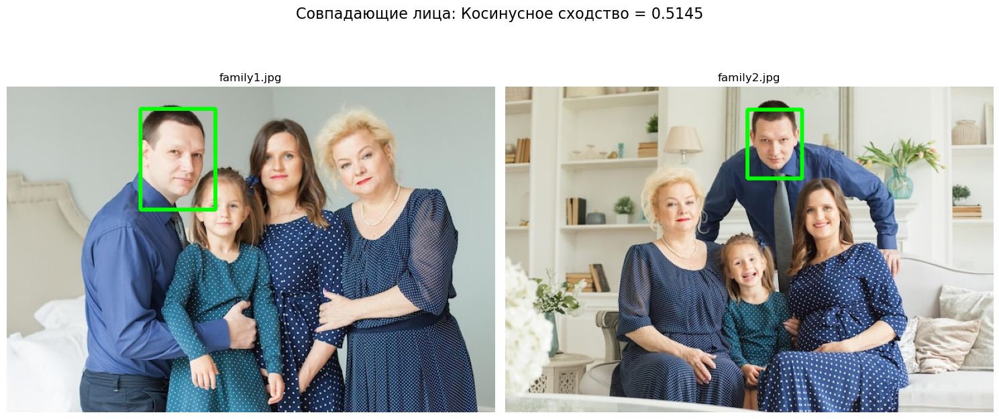

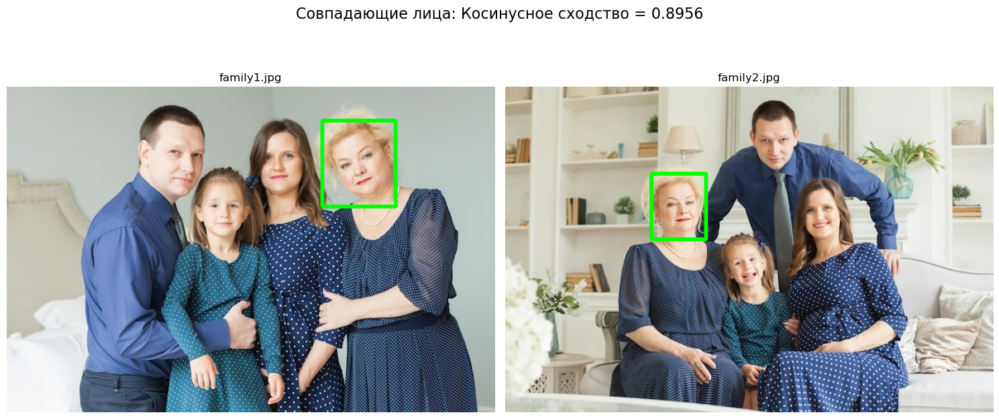

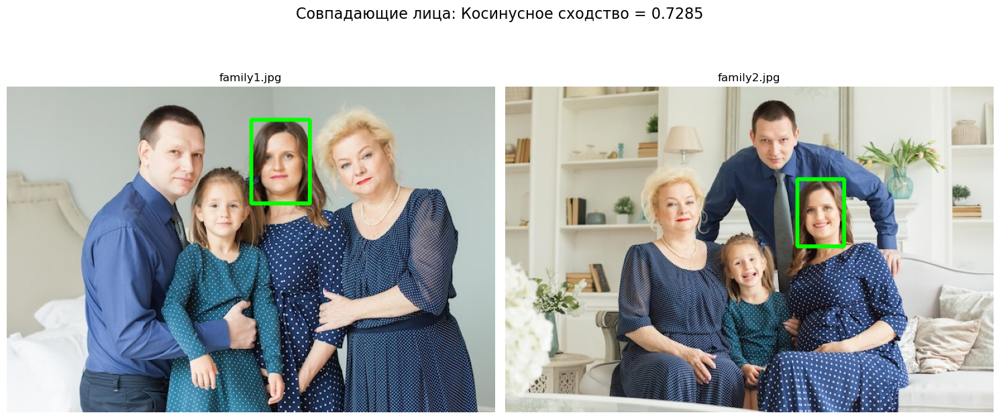

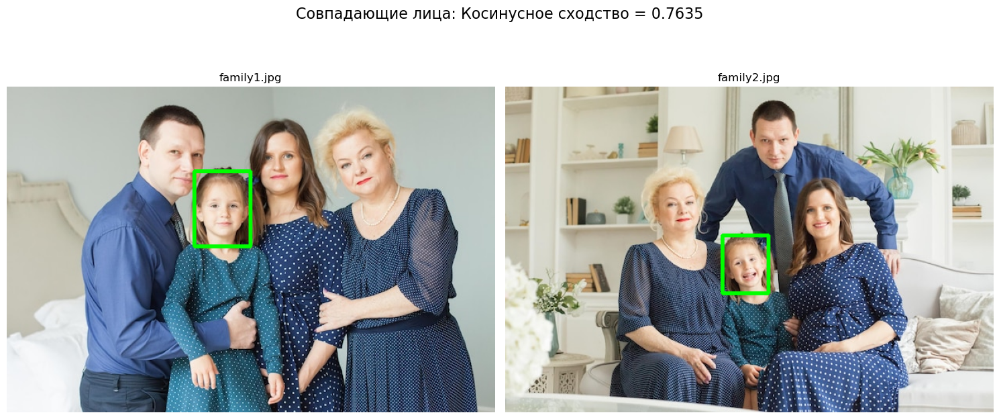

Среднее сходство векторов выше порога (0.5): 0.7255
Среднее сходство векторов ниже порога (0.5): 0.1479


In [12]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os

# Определим порог косинусного сходства для идентификации совпадений
COSINE_SIMILARITY_THRESHOLD = 0.5 # Это значение можно настроить в зависимости от желаемой строгости

# Отфильтруем совпадающие пары, которые взяты из разных изображений
matching_pairs_different_images = []
above_threshold_similarities = []
below_threshold_similarities = []

for pair in pairs_similarity:
    if pair['similarity'] >= COSINE_SIMILARITY_THRESHOLD:
        if pair['image1_path'] != pair['image2_path']:
            matching_pairs_different_images.append(pair)
        above_threshold_similarities.append(pair['similarity'])
    else:
        below_threshold_similarities.append(pair['similarity'])

print(f"Идентифицировано {len(matching_pairs_different_images)} совпадающих пар лиц из разных изображений со сходством >= {COSINE_SIMILARITY_THRESHOLD}.")

# Группируем исходные изображения для эффективной загрузки и отображения
original_images_cache = {}
for img_path in image_paths:
    original_images_cache[img_path] = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

def plot_matching_faces(img1_path, bbox1, img2_path, bbox2, similarity_score):
    img1 = original_images_cache[img1_path].copy()
    img2 = original_images_cache[img2_path].copy()

    fig, axes = plt.subplots(1, 2, figsize=(15, 7))
    fig.suptitle(f"Совпадающие лица: Косинусное сходство = {similarity_score:.4f}", fontsize=16)

    # Отображаем первое лицо
    x1_1, y1_1, x2_1, y2_1 = [int(v) for v in bbox1]
    cv2.rectangle(img1, (x1_1, y1_1), (x2_1, y2_1), (0, 255, 0), 4) # Зеленый прямоугольник
    axes[0].imshow(img1)
    axes[0].set_title(os.path.basename(img1_path))
    axes[0].axis('off')

    # Отображаем второе лицо
    x1_2, y1_2, x2_2, y2_2 = [int(v) for v in bbox2]
    cv2.rectangle(img2, (x1_2, y1_2), (x2_2, y2_2), (0, 255, 0), 4) # Зеленый прямоугольник
    axes[1].imshow(img2)
    axes[1].set_title(os.path.basename(img2_path))
    axes[1].axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Визуализируем идентифицированные совпадающие пары из разных изображений
if matching_pairs_different_images:
    print("Визуализация совпадающих пар лиц из разных изображений:")
    for match_pair in matching_pairs_different_images:
        plot_matching_faces(
            match_pair['image1_path'], match_pair['bbox1'],
            match_pair['image2_path'], match_pair['bbox2'],
            match_pair['similarity']
        )
else:
    print("Совпадающие пары лиц из разных изображений с заданным порогом не найдены.")

# Выведем средние значения сходства
if above_threshold_similarities:
    avg_above_threshold = np.mean(above_threshold_similarities)
    print(f"Среднее сходство векторов выше порога ({COSINE_SIMILARITY_THRESHOLD}): {avg_above_threshold:.4f}")
else:
    print(f"Нет векторов выше порога ({COSINE_SIMILARITY_THRESHOLD}).")

if below_threshold_similarities:
    avg_below_threshold = np.mean(below_threshold_similarities)
    print(f"Среднее сходство векторов ниже порога ({COSINE_SIMILARITY_THRESHOLD}): {avg_below_threshold:.4f}")
else:
    print(f"Нет векторов ниже порога ({COSINE_SIMILARITY_THRESHOLD}).")

# Выводы

Работает ) Нам повезло, что мужчина заматчился, потому что он почти в профиль на одном из фото, а мы такому не обучали. Его косинусное сходство на грани - 0.51. Но приятно, что нейросеть всё-таки смогла.

Девочка заматчилась с большим запасом, несмотря на широчайшую улыбку на втором фото.